In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [4]:
def carregar_img():
    img = cv.imread("../src/scene2.jpg")
    img2 = cv.imread("../src/mousepad.jpg")

    img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    img = cv.resize(img, (0,0), fx=0.3, fy=0.3)
    img2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
    img2 = cv.resize(img2, (0,0), fx=0.3, fy=0.3)

    return img, img2

# Questão 1

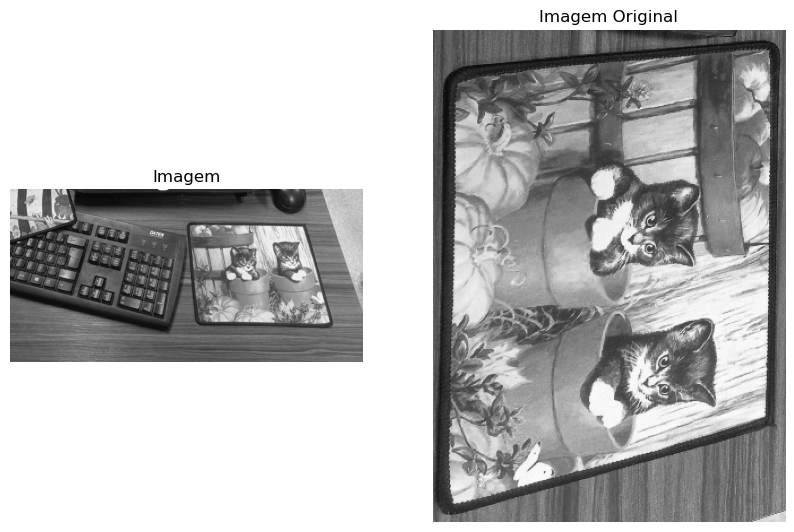

In [5]:
img, img2 = carregar_img()

plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(img, cmap='gray')
plt.title('Imagem')
plt.axis('off')

plt.subplot(122)
plt.imshow(img2, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')
plt.show()

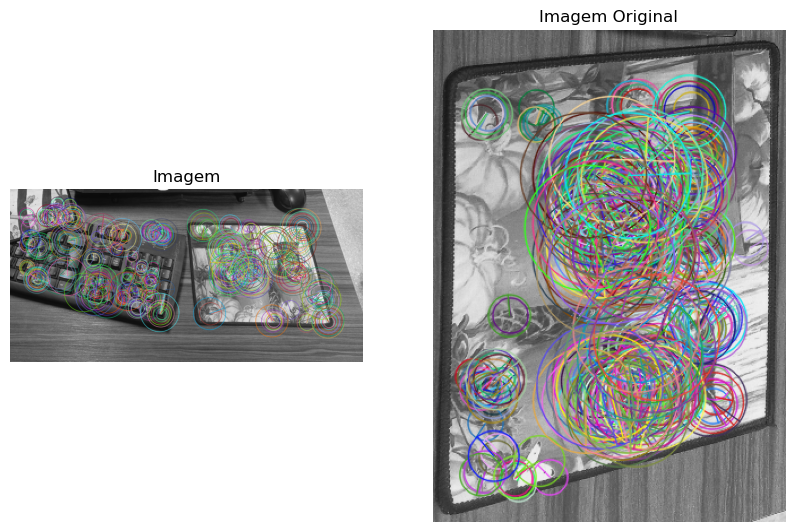

In [5]:
orb = cv.ORB_create()
kp = orb.detect(img, None)
kp, des = orb.compute(img, kp)

orb2 = cv.ORB_create()
kp2 = orb2.detect(img2, None)
kp2, des2 = orb2.compute(img2, kp2)

img_out = cv.drawKeypoints(img, kp, (255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_out2 = cv.drawKeypoints(img2, kp2, (0, 0, 255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(img_out)
plt.title('Imagem')
plt.axis('off')

plt.subplot(122)
plt.imshow(img_out2)
plt.title('Imagem Original')
plt.axis('off')
plt.show()

(-0.5, 1326.5, 497.5, -0.5)

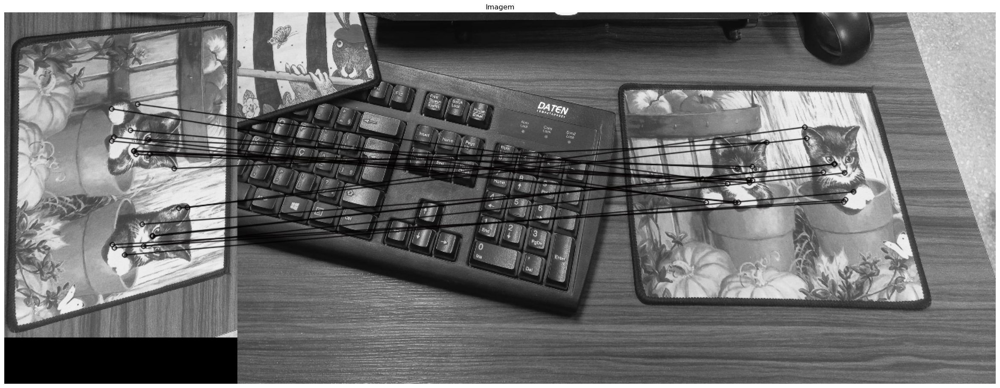

In [6]:
bf = cv.BFMatcher(cv.NORM_L2, True)
matches = bf.match(des2, des)

matches = sorted(matches, key = lambda x:x.distance)

img3 = cv.drawMatches(img2, kp2, img, kp, matches[:20], None,3, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(30, 30))
plt.imshow(img3)
plt.title('Imagem')
plt.axis('off')

# Questão 2

(-0.5, 1326.5, 497.5, -0.5)

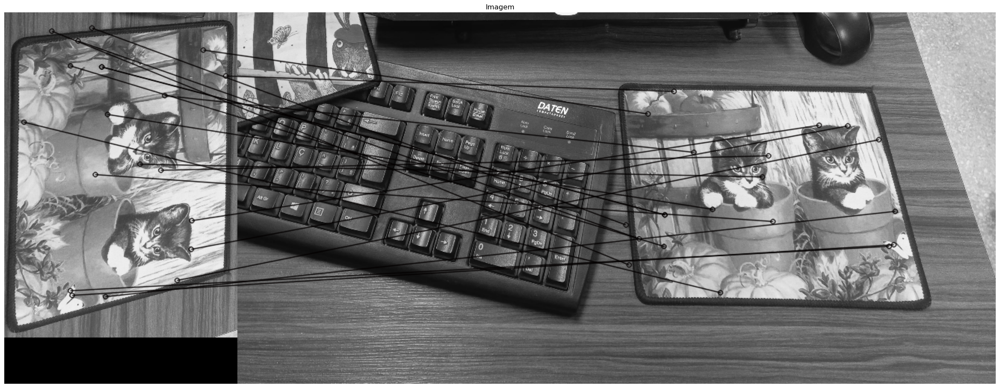

In [7]:
img, img2 = carregar_img()

sift = cv.SIFT_create()
kp = sift.detect(img, None)
kp, des = sift.compute(img, kp)

sift2 = cv.SIFT_create()
kp2 = sift2.detect(img2, None)
kp2, des2 = sift2.compute(img2, kp2)

bf = cv.BFMatcher(cv.NORM_L2, True)
matches = bf.match(des2, des)

matches = sorted(matches, key = lambda x:x.distance)

img3 = cv.drawMatches(img2, kp2, img, kp, matches[:20], None,3, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(30, 30))
plt.imshow(img3)
plt.title('Imagem')
plt.axis('off')

# Questão 3

Número de bons pareamentos: 32


(-0.5, 1326.5, 497.5, -0.5)

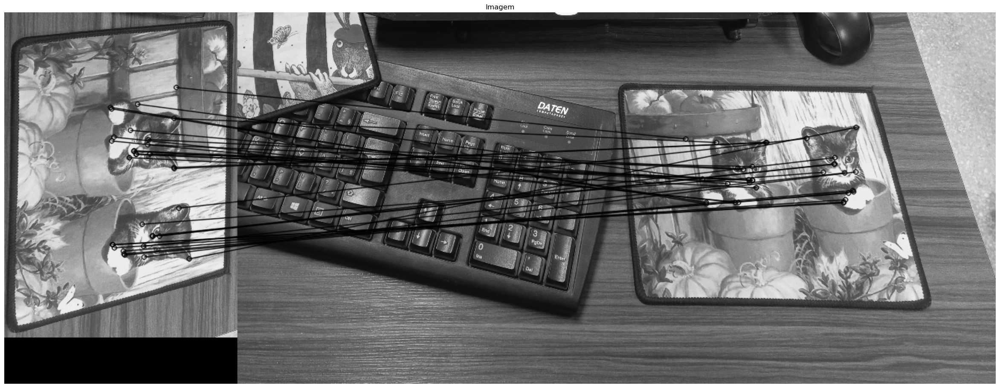

In [8]:
img, img2 = carregar_img()

orb = cv.ORB_create()
kp = orb.detect(img, None)
kp, des = orb.compute(img, kp)

orb2 = cv.ORB_create()
kp2 = orb2.detect(img2, None)
kp2, des2 = orb2.compute(img2, kp2)

bf = cv.BFMatcher()
matches = bf.knnMatch(des2, des, 2)

good_matches = []
for m, n in matches:
    if m.distance < 0.55 * n.distance:
        good_matches.append(m)

print(f'Número de bons pareamentos: {len(good_matches)}')

img3 = cv.drawMatches(img2, kp2, img, kp, good_matches, None,3, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(30, 30))
plt.imshow(img3)
plt.title('Imagem')
plt.axis('off')

# Questão 4

Número de bons pareamentos: 95


(-0.5, 1326.5, 497.5, -0.5)

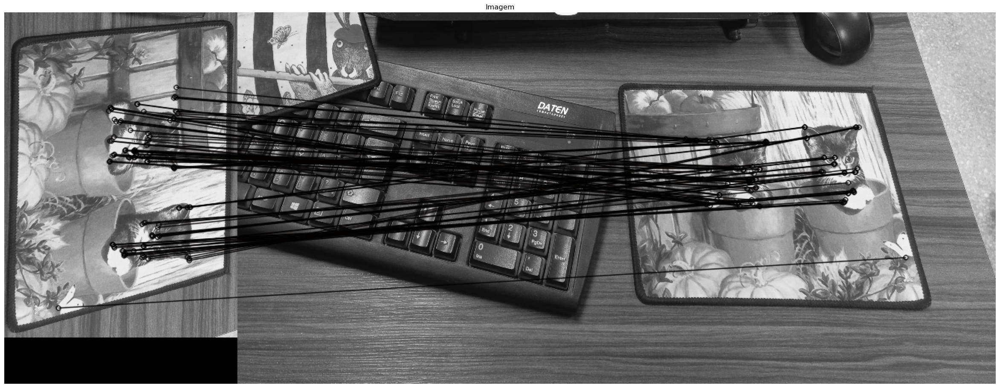

In [9]:
img, img2 = carregar_img()

orb = cv.ORB_create()
kp = orb.detect(img, None)
kp, des = orb.compute(img, kp)

orb2 = cv.ORB_create()
kp2 = orb2.detect(img2, None)
kp2, des2 = orb2.compute(img2, kp2)

FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                    table_number = 6,
                    key_size = 12,
                    multi_probe_level = 1)
search_params = dict(checks=100)

flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des2, des, 2)

good_matches = []
for m, n in matches:
    if m.distance < 0.55 * n.distance:
        good_matches.append(m)

print(f'Número de bons pareamentos: {len(good_matches)}')

img3 = cv.drawMatches(img2, kp2, img, kp, good_matches, None,3, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(30, 30))
plt.imshow(img3)
plt.title('Imagem')
plt.axis('off')